# Prédiction de la volatilité

In [ ]:
!pip install -q yfinance arch


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.0/983.0 kB 5.5 MB/s eta 0:00:00


In [ ]:
#@title Imports
import datetime as dt
import sys
import numpy as np
from numpy import cumsum, log, polyfit, sqrt, std, subtract
from numpy.random import randn
import pandas as pd
from pandas_datareader import data as web
import seaborn as sns
from pylab import rcParams
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from arch import arch_model
from numpy.linalg import LinAlgError
from scipy import stats
import statsmodels.api as sm
import statsmodels.tsa.api as tsa
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import acf, q_stat, adfuller
from sklearn.metrics import mean_squared_error
from scipy.stats import probplot, moment
from arch import arch_model
from arch.univariate import ConstantMean, GARCH, Normal
from sklearn.model_selection import TimeSeriesSplit
import yfinance as yf

In [ ]:
%matplotlib inline
pd.set_option('display.max_columns', None)
sns.set(style="darkgrid", color_codes=True)
rcParams['figure.figsize'] = 8,4

## Observation de la série temporelle de la volatilité de produit financier: Cas de la volatilité du S&P500 (SPX)

In [ ]:
import numpy  as np
import pandas as pd
import matplotlib.pyplot as plt
from yfinance import download

# Télécharger les données du S&P500
SPX_data = download('^GSPC', start='2005-01-01', end='2024-03-21')

# Calculer les logs-rendements
SPX_data["Return"] = 100 * (SPX_data['Adj Close'].pct_change())
SPX_data["Log_Return"] = np.log(SPX_data['Adj Close'] / SPX_data['Adj Close'].shift(1))

SPX_data = SPX_data.dropna()
SPX_data["Log_Return"]

[*********************100%%**********************]  1 of 1 completed


Date
2005-01-04   -0.011740
2005-01-05   -0.003634
2005-01-06    0.003500
2005-01-07   -0.001432
2005-01-10    0.003417
                ...   
2024-03-14   -0.002875
2024-03-15   -0.006504
2024-03-18    0.006298
2024-03-19    0.005633
2024-03-20    0.008865
Name: Log_Return, Length: 4835, dtype: float64

**L'exposant de Hurst** est une mesure statistique utilisée pour classifier les séries temporelles et inférer le niveau de difficulté à prédire et à choisir un modèle approprié pour la série en question. L'exposant de Hurst est utilisé comme mesure de la mémoire à long terme des séries temporelles. Il est lié aux autocorrélations de la série temporelle, ainsi qu'au taux de décroissance de celles-ci lorsque le décalage entre les paires de valeurs augmente.

Une valeur proche de 0,5 indique une série aléatoire.
Une valeur proche de 0 indique une série de réversion à la moyenne.
Une valeur proche de 1 indique une série tendancielle.

In [ ]:
def hurst(ts):
    """Returns the Hurst Exponent of the time series vector ts"""
    # Create the range of lag values
    lags = range(2, 100)

    # Calculate the array of the variances of the lagged differences
    tau = [sqrt(std(subtract(ts[lag:], ts[:-lag]))) for lag in lags]

    # Use a linear fit to estimate the Hurst Exponent
    poly = polyfit(log(lags), log(tau), 1)

    # Return the Hurst exponent from the polyfit output
    return poly[0]*2.0

def plot_correlogram(x, lags=None, title=None):
    lags = min(10, int(len(x)/5)) if lags is None else lags
    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 8))
    x.plot(ax=axes[0][0])
    q_p = np.max(q_stat(acf(x, nlags=lags), len(x))[1])
    stats = f'Q-Stat: {np.max(q_p):>8.2f}\nADF: {adfuller(x)[1]:>11.2f} \nHurst: {round(hurst(x.values),2)}'
    axes[0][0].text(x=.02, y=.85, s=stats, transform=axes[0][0].transAxes)
    probplot(x, plot=axes[0][1])
    mean, var, skew, kurtosis = moment(x, moment=[1, 2, 3, 4])
    s = f'Mean: {mean:>12.2f}\nSD: {np.sqrt(var):>16.2f}\nSkew: {skew:12.2f}\nKurtosis:{kurtosis:9.2f}'
    axes[0][1].text(x=.02, y=.75, s=s, transform=axes[0][1].transAxes)
    plot_acf(x=x, lags=lags, zero=False, ax=axes[1][0])
    plot_pacf(x, lags=lags, zero=False, ax=axes[1][1])
    axes[1][0].set_xlabel('Lag')
    axes[1][1].set_xlabel('Lag')
    fig.suptitle(title, fontsize=20)
    fig.tight_layout()
    fig.subplots_adjust(top=.9)

**Le clustering de la volatilité** fait référence à l'observation selon laquelle "les grands changements ont tendance à être suivis de grands changements, de signe quelconque, et les petits changements ont tendance à être suivis de petits changements."

Le clustering de la volatilité est fréquemment observé dans les données des marchés financiers, et il pose un défi pour la modélisation des séries temporelles. Avec le jeu de données des prix quotidiens du S&P 500, nous calculons les rendements quotidiens comme les variations de pourcentage des prix, traçons les résultats et observons leur comportement au fil du temps

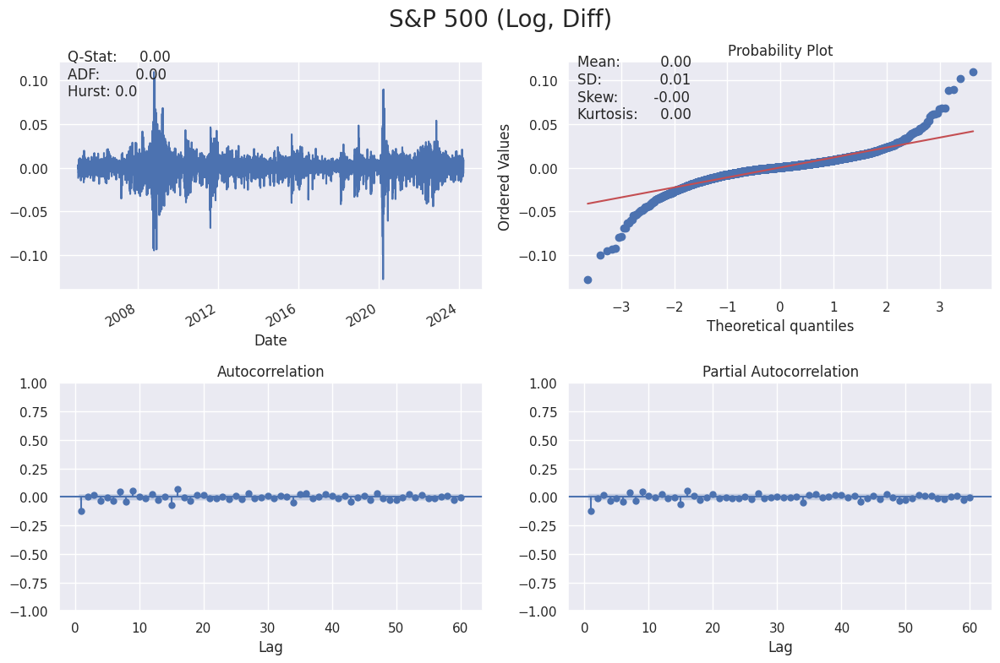

In [ ]:
# On Plot ACF, PACF et le  Q-Q plot et on a la p-value de l'ADF de la serie temporelle
plot_correlogram(SPX_data['Log_Return'], lags=60, title='S&P 500 (Log, Diff)')

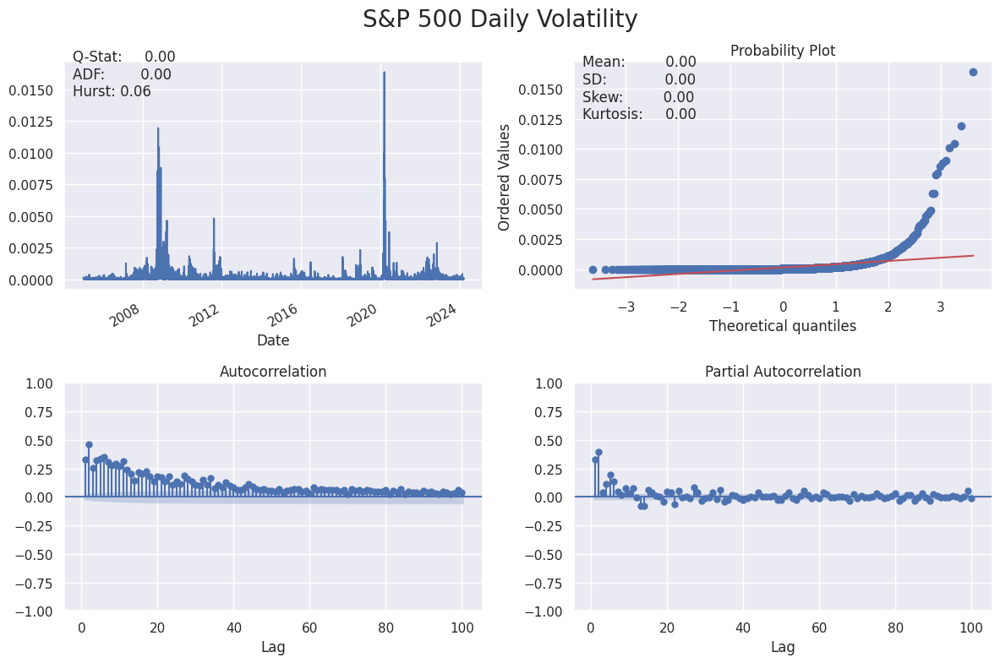

In [ ]:
plot_correlogram(SPX_data['Log_Return'].sub(SPX_data['Log_Return'].mean()).pow(2), lags=100, title='S&P 500 Daily Volatility')

Nous calculons la volatilité historique ou réalisée.

In [ ]:
ann_factor = np.sqrt(5 / 252)  # Assuming 252 trading days in a year
SPX_data['Daily_Volatility'] = SPX_data['Log_Return'].rolling(window=5).std()*ann_factor
SPX_data = SPX_data.dropna()

<ipython-input-8-c4d94469f366>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  SPX_data['Daily_Volatility'] = SPX_data['Log_Return'].rolling(window=5).std()*ann_factor


<Axes: title={'center': 'SPX realized volatility'}, xlabel='Date'>

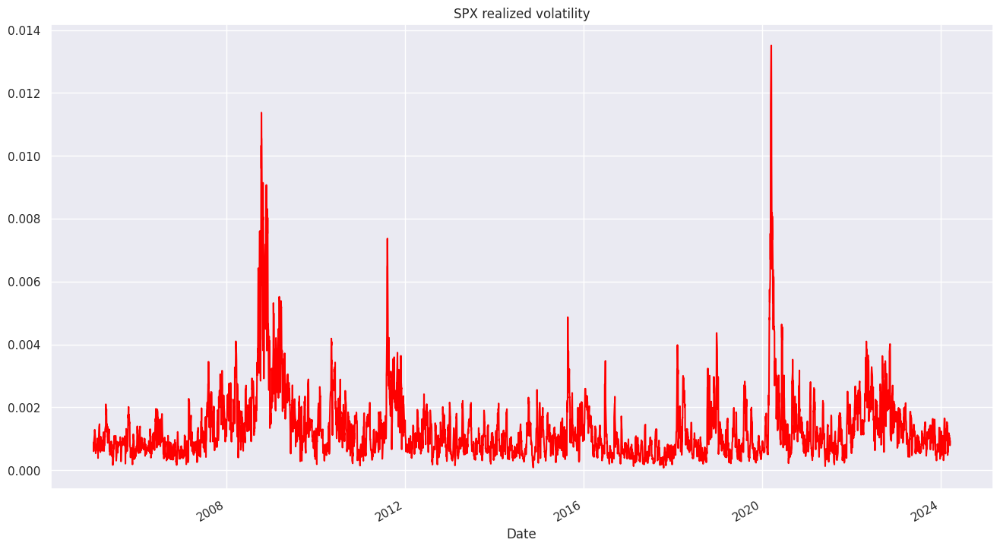

In [ ]:

SPX_data['Daily_Volatility'].plot(color='red', grid=True, title='SPX realized volatility',
         figsize=(16, 9))

## **Rough Volatility predictor**

La régularité du processus de volatilité :
Pour $q \geq 0$, nous définissons le $q$-ème moment d'échantillon des différences de la volatilité logarithmique à un décalage donné $\Delta$. ($\langle \cdot \rangle$ représente la moyenne de l'échantillon) :
$$
m(q,\Delta) = \langle |\log \sigma_{t+\Delta} - \log \sigma_t|^q \rangle
$$
Par exemple,
$$
m(2,\Delta) = \langle (\log \sigma_{t+\Delta} - \log \sigma_t)^2 \rangle
$$
représente simplement la variance de l'échantillon des différences de la volatilité logarithmique au décalage $\Delta$.


### Échelle de $m(q, \Delta)$ avec le décalage $\Delta$


In [ ]:
colors = sns.color_palette('bright')

[0.08637472483132425, 0.16214360719426893, 0.2317601770048035, 0.2976745177272152, 0.42462949953157575]


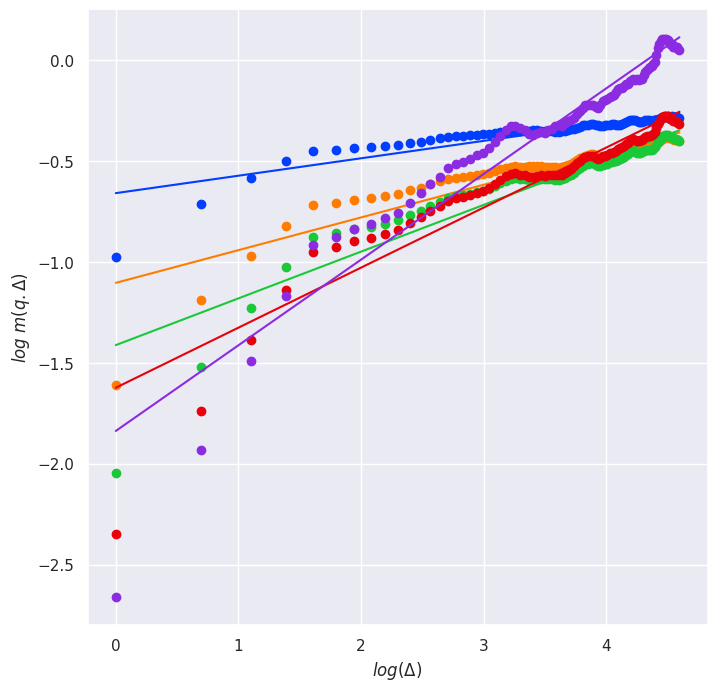

In [ ]:
SPX_data['Log_Daily_Volatility'] = np.log(SPX_data['Daily_Volatility'])

def m(data, q,delta):
  return [np.mean(np.abs(data['Log_Daily_Volatility'] - data['Log_Daily_Volatility'].shift(lag)) ** q)
            for lag in delta]

plt.figure(figsize=(8, 8))
plt.xlabel('$log(\Delta)$')
plt.ylabel('$log\  m(q.\Delta)$')

zeta_q = list()
q_list = np.array([.5, 1, 1.5, 2, 3])
x = np.arange(1, 100)
for i, q in enumerate(q_list):
    plt.plot(np.log(x), np.log(m(SPX_data, q, x)), 'o', color=colors[i])
    model = np.polyfit(np.log(x), np.log(m(SPX_data, q, x)), 1)
    plt.plot(np.log(x), np.log(x) * model[0] + model[1], color=colors[i])
    zeta_q.append(model[0])
# Est-ce que ça te va?
print(zeta_q)

### Résultat d'échelle monofractale
D'après le graphique log-log ci-dessus, nous observons que pour chaque $q$, $m(q, \Delta) \propto \Delta^{\zeta_q}$.
Comment $\zeta_q$ évolue-t-il avec $q$ ?


0.1407031896996415


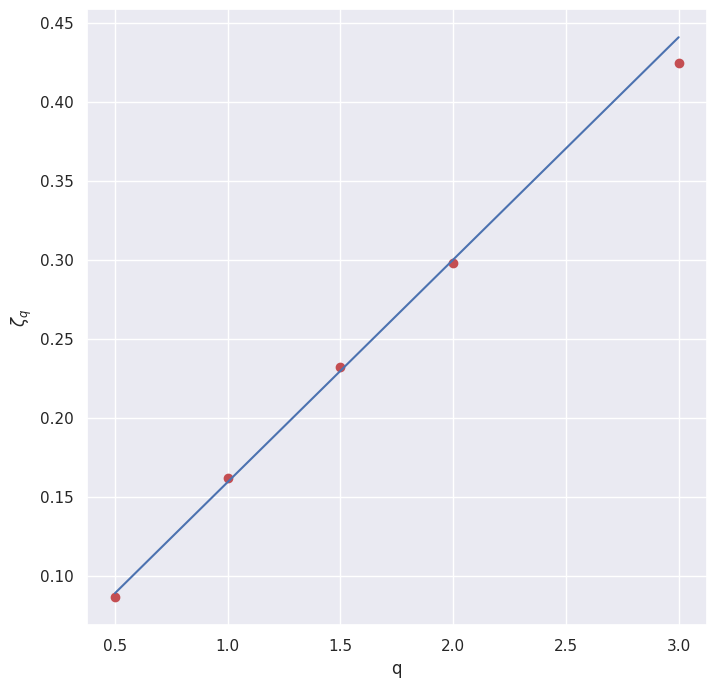

In [ ]:

plt.figure(figsize=(8,8))
plt.xlabel('q')
plt.ylabel('$\zeta_{q}$')
plt.plot(q_list, zeta_q, 'or')

line = np.polyfit(q_list[:4], zeta_q[:4],1)
plt.plot(q_list, line[0] * q_list + line[1])
h_est= line[0]
print(h_est)

### Analyse pour d'autres actifs

In [ ]:
Ticker = ["^GSPC", "GOOGL", "AAPL", "KO", "MSFT", "GC=F", "BZ=F", "NVDA", "INTC"]


h = list()
nu = list()
for ticker in Ticker:
    # Télécharger les données du S&P500
  data = download(ticker, start='2005-01-01', end='2024-03-21')

  # Calculer les logs-rendements
  data["Log_Return"] = np.log(data['Adj Close'] / data['Adj Close'].shift(1))

  data = data.dropna()

  ann_factor = np.sqrt(5 / 252)  # Assuming 252 trading days in a year
  data['Daily_Volatility'] = data['Log_Return'].rolling(window=5).std()*ann_factor
  data = data.dropna()
  data['Log_Daily_Volatility'] = np.log(data['Daily_Volatility'])
  model = np.polyfit(np.log(x), np.log(m(data, 2, x)), 1)
  nu.append(np.sqrt(np.exp(model[1])))
  h.append(model[0]/2.)
Assets_h_index = pd.DataFrame({'names':Ticker, 'h': h, 'nu': nu})
display(Assets_h_index)

[*********************100%%**********************]  1 of 1 completed
<ipython-input-13-7c0f2484e4c1>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Daily_Volatility'] = data['Log_Return'].rolling(window=5).std()*ann_factor
[*********************100%%**********************]  1 of 1 completed
<ipython-input-13-7c0f2484e4c1>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Daily_Volatility'] = data['Log_Return'].rolling(window=5).std()*ann_factor
[*********************100%%*********************

,names,h,nu
0,^GSPC,0.148837,0.444150
1,GOOGL,0.097106,0.520188
2,AAPL,0.104616,0.485647
3,KO,0.095554,0.522897
4,MSFT,0.108798,0.508457
5,GC=F,0.089776,0.474940
6,BZ=F,0.125933,0.456607
7,NVDA,0.097446,0.505515
8,INTC,0.099904,0.510889


Nous trouvons la relation d'échelle monofractale

$\zeta_q = qH$

avec $H \approx 0.14$.

Notez cependant que $H$ varie au fil du temps, dans une plage étroite.
Notez également que notre estimation de $H$ est biaisée à la hausse car nous avons approximé la variance instantanée $v_t$ par sa moyenne sur chaque journée $ \frac{1}{T} \int_{0}^{T} v_t dt $.


**L'universalité de ce resultat est montrée dans l'article: Volatility is rough de [Gatheral, Jaisson and Rosenbaum]**

De ce résultat, on peut ecrire: $log(\sigma_{t+\Delta}) - log(\sigma_t) = \nu(W^{H}_{t+\Delta} - W^{H}_t)$ avec $W^H$ un mouvement brownien fractionnaire d'indice de Hurst H proche de 0.1. ( the RFSV (for Rough Fractional Stochastic Volatility))


La motion brownienne fractionnaire (fBm) $ W^H_t ; t \in \mathbb{R} $ est le processus gaussien unique avec une moyenne nulle et une fonction d'autocovariance

$$ E[W^H_t W^H_s] = \frac{1}{2} \left\{ |t|^{2H} + |s|^{2H} - |t - s|^{2H} \right\} $$

où $ H \in (0,1) $ est appelé l'indice de Hurst ou paramètre.

En particulier, lorsque $ H = \frac{1}{2} $, fBm est simplement le mouvement brownien.

Si $ H > \frac{1}{2} $, les incréments sont positivement corrélés, donc le processus est en tendance.

Si $ H < \frac{1}{2} $, les incréments sont négativement corrélés, donc le processus est en réversion.


Il existe une infinité de représentations possibles de fBm en termes de mouvement brownien. Par exemple, avec $\gamma = \frac{1}{2} - H$,

**Mandelbrot-Van Ness**

$$ W^H_t = C_H \left\{ \int_{t}^{-\infty} dW_s (t-s)^{\gamma} - \int_{0}^{-\infty} dW_s (-s)^{\gamma} \right\} $$

Le choix

$$ C_H = \sqrt{2H \frac{\Gamma \left(\frac{3}{2} - H \right)}{\Gamma(2 - 2H)\Gamma \left( H + \frac{1}{2} \right) }} $$

assure que

$$ E[W^H_t W^H_s] = \frac{1}{2} \{ t^{2H} + s^{2H} - |t-s|^{2H} \} $$


**La formule de prévision**

Ainsi, nous obtenons

Formule de prévision de la variance

$$ E^P[v_{t+\Delta}|F_t] = \exp \left\{ E^P[\log(v_{t+\Delta})|F_t] + 2c \nu^2 \Delta^{2H} \right\} $$

où

$$ E^P[\log v_{t+\Delta}|F_t] = \frac{\cos(H\pi)}{\pi} \Delta^{H+\frac{1}{2}} + \frac{1}{2} \int_{t}^{-\infty} \frac{\log v_s(t-s+\Delta)}{(t-s)^{H+\frac{1}{2}}} ds. $$


In [ ]:
import scipy.special as scsp
import math


def c_tilde(h):
    return scsp.gamma(3. / 2. - h) / scsp.gamma(h + 1. / 2.) * scsp.gamma(2. - 2. * h)

def forecast_XTS(rvdata, h, date, nLags, delta, nu):
    i = np.arange(nLags)
    cf = 1./((i + 1. / 2.) ** (h + 1. / 2.) * (i + 1. / 2. + delta))
    ldata = rvdata.truncate(after=date)
    l = len(ldata)
    ldata = np.log(ldata.iloc[l - nLags:])
    ldata['cf'] = np.fliplr([cf])[0]
    # print ldata
    ldata = ldata.dropna()
    fcst = (ldata.iloc[:, 0] * ldata['cf']).sum() / sum(ldata['cf'])

    return math.exp(fcst + 2 * nu ** 2 * c_tilde(h) * delta ** (2 * h))

In [ ]:
rvdata = pd.DataFrame(SPX_data['Daily_Volatility']**2)
nu  = Assets_h_index['nu'][0] # Vol of vol estimate for SPX
h = Assets_h_index['h'][0]
n = len(rvdata)
delta = 1
nLags = 500
dates = rvdata.iloc[nLags:n-delta].index
rv_predict = [forecast_XTS(rvdata, h=h, date=d, nLags=nLags,
                           delta=delta, nu=nu) for d in dates]
rv_actual = rvdata.iloc[nLags+delta:n].values

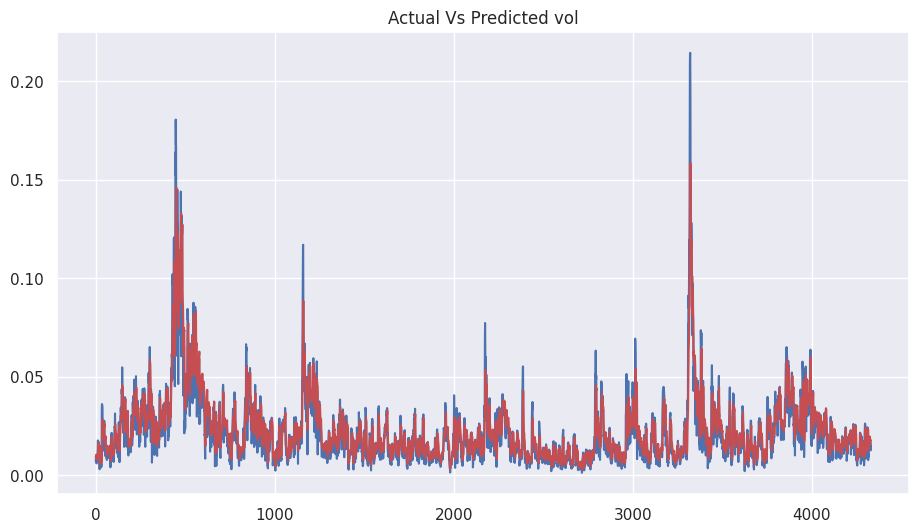

In [ ]:
plt.figure(figsize=(11, 6))
vol_actual = np.sqrt(np.multiply(rv_actual,252))
vol_predict = np.sqrt(np.multiply(rv_predict,252))
plt.title('Actual Vs Predicted vol')
plt.plot(vol_actual, "b")
plt.plot(vol_predict, "r");

In [ ]:
def calculate_mape(actual, predicted):
    """
    Compute the Mean Absolute Percentage Error (MAPE) between actual and predicted values.

    Parameters:
    actual (array-like): Actual values.
    predicted (array-like): Predicted values.

    Returns:
    float: MAPE score.
    """
    actual, predicted = np.squeeze(actual), np.squeeze(predicted)
    min_length = min(len(actual), len(predicted))
    actual = actual[:min_length]
    predicted = predicted[:min_length]
    return np.mean(np.abs((actual - predicted) / actual)) * 100




In [ ]:
mape_score = calculate_mape(vol_actual, vol_predict)
print("MAPE:", mape_score)

MAPE: 30.751479207844547


Iteration:      1,   Func. Count:      6,   Neg. LLF: 235485201525.65515
Iteration:      2,   Func. Count:     19,   Neg. LLF: -15769.973293901548
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15769.973329258508
            Iterations: 6
            Function evaluations: 19
            Gradient evaluations: 2
Date
2005-01-10    0.006548
2005-01-11    0.006441
2005-01-12    0.006640
2005-01-13    0.006550
2005-01-14    0.007030
                ...   
2024-03-14    0.008201
2024-03-15    0.007964
2024-03-18    0.007996
2024-03-19    0.007902
2024-03-20    0.007774
Name: cond_vol, Length: 4831, dtype: float64


/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:311: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001498. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


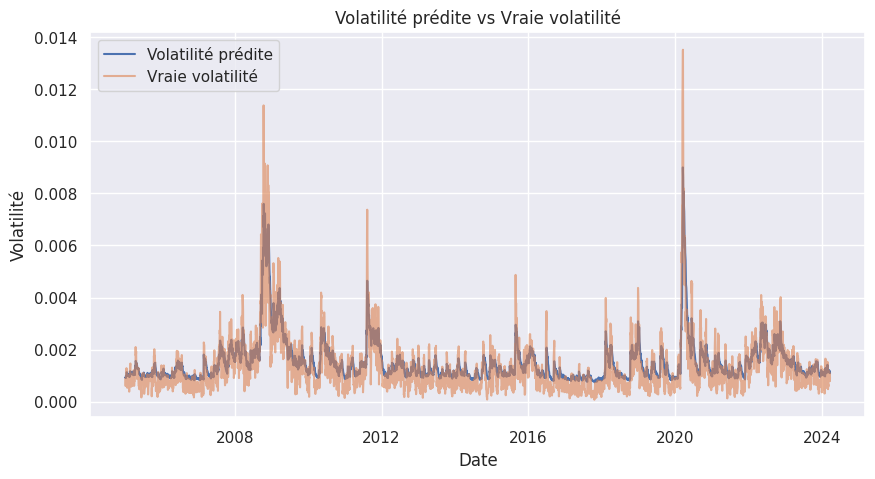

In [ ]:
# Spécifier le modèle GARCH(1, 1)
model = arch_model(SPX_data['Log_Return'], vol='Garch', p=1, q=1)

# Ajuster le modèle aux données
model_fit = model.fit()

# Prédire la volatilité
volatility = model_fit.conditional_volatility
volatility = volatility

print(volatility)

import matplotlib.pyplot as plt

# Supposons que 'volatility' est la volatilité prédite et 'sp500['Log_Return']' est la vraie volatilité
plt.figure(figsize=(10,5))
plt.plot(volatility.index, ann_factor*volatility, label='Volatilité prédite')
plt.plot(SPX_data['Daily_Volatility'].index, SPX_data['Daily_Volatility'], label='Vraie volatilité', alpha=0.6)
plt.title('Volatilité prédite vs Vraie volatilité')
plt.xlabel('Date')
plt.ylabel('Volatilité')
plt.legend()
plt.show()


# Processus de Hawkes

In [ ]:
!pip install pandas_ta

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.1/115.1 kB 2.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pandas_ta: filename=pandas_ta-0.3.14b0-py3-none-any.whl size=218907 sha256=63e7fa4fdc6463aa536a3fe6a8155ab98efd89254a4b65216cd48279f91613f8
  Stored in directory: /root/.cache/pip/wheels/69/00/ac/f7fa862c34b0e2ef320175100c233377b4c558944f12474cf0
Successfully built pandas_ta


In [ ]:
!pip install datetime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.6/52.6 kB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 247.3/247.3 kB 10.9 MB/s eta 0:00:00


[*********************100%%**********************]  1 of 1 completed


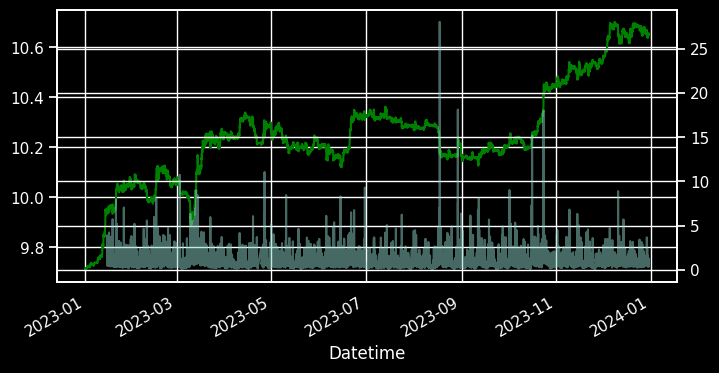

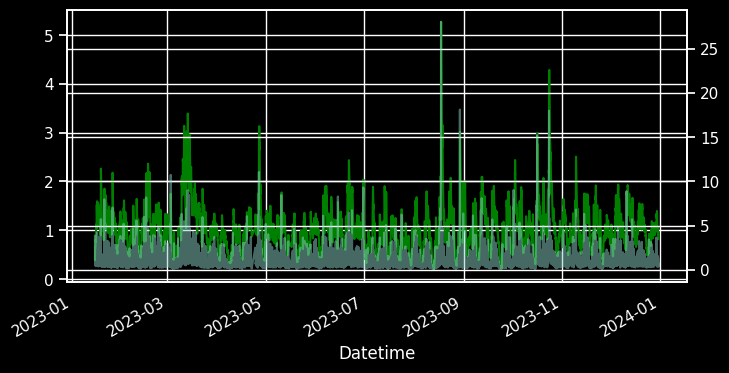

Profit Factor 1.0461661034491434
Long Win Rate 0.5789470637120717
Long Average 0.025258200540659848
Short Win Rate 0.27272714876038695
Short Average -0.008993903936138019
Time In Market 0.4878640776699029


Text(66.25, 0.5, 'Threshold Lookback')

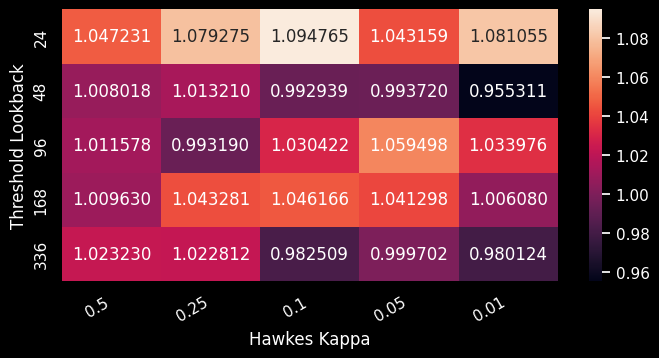

In [ ]:
import pandas as pd
import numpy as np
import pandas_ta as ta
import matplotlib.pyplot as plt
import scipy

def plot_two_axes(series1, *ex_series):
    plt.style.use('dark_background')
    ax = series1.plot(color='green')
    ax2 = ax.twinx()
    for i, series in enumerate(ex_series):
        series.plot(ax=ax2, alpha=0.5)
    plt.show()

def hawkes_process(data: pd.Series, kappa: float):
    assert(kappa > 0.0)
    alpha = np.exp(-kappa)
    arr = data.to_numpy()
    output = np.zeros(len(data))
    output[:] = np.nan
    for i in range(1, len(data)):
        if np.isnan(output[i - 1]):
            output[i] = arr[i]
        else:
            output[i] = output[i - 1] * alpha + arr[i]
    return pd.Series(output, index=data.index) * kappa

def vol_signal(close: pd.Series, vol_hawkes: pd.Series, lookback:int):
    signal = np.zeros(len(close))
    q05 = vol_hawkes.rolling(lookback).quantile(0.05)
    q95 = vol_hawkes.rolling(lookback).quantile(0.95)

    last_below = -1
    curr_sig = 0

    for i in range(len(signal)):
        if vol_hawkes.iloc[i] < q05.iloc[i]:
            last_below = i
            curr_sig = 0

        if vol_hawkes.iloc[i] > q95.iloc[i] \
           and vol_hawkes.iloc[i - 1] <= q95.iloc[i - 1] \
           and last_below > 0 :

            change = close.iloc[i] - close.iloc[last_below]
            if change > 0.0:
                curr_sig = 1
            else:
                curr_sig = -1
        signal[i] = curr_sig

    return signal

def get_trades_from_signal(data: pd.DataFrame, signal: np.array):
    # Gets trade entry and exit times from a signal
    # that has values of -1, 0, 1. Denoting short,flat,and long.
    # No position sizing.

    long_trades = []
    short_trades = []

    close_arr = data['Close'].to_numpy()
    last_sig = 0.0
    open_trade = None
    idx = data.index
    for i in range(len(data)):
        if signal[i] == 1.0 and last_sig != 1.0: # Long entry
            if open_trade is not None:
                open_trade[2] = idx[i]
                open_trade[3] = close_arr[i]
                short_trades.append(open_trade)

            open_trade = [idx[i], close_arr[i], -1, np.nan]
        if signal[i] == -1.0  and last_sig != -1.0: # Short entry
            if open_trade is not None:
                open_trade[2] = idx[i]
                open_trade[3] = close_arr[i]
                long_trades.append(open_trade)

            open_trade = [idx[i], close_arr[i], -1, np.nan]

        if signal[i] == 0.0 and last_sig == -1.0: # Short exit
            open_trade[2] = idx[i]
            open_trade[3] = close_arr[i]
            short_trades.append(open_trade)
            open_trade = None

        if signal[i] == 0.0  and last_sig == 1.0: # Long exit
            open_trade[2] = idx[i]
            open_trade[3] = close_arr[i]
            long_trades.append(open_trade)
            open_trade = None

        last_sig = signal[i]

    long_trades = pd.DataFrame(long_trades, columns=['entry_time', 'entry_price', 'exit_time', 'exit_price'])
    short_trades = pd.DataFrame(short_trades, columns=['entry_time', 'entry_price', 'exit_time', 'exit_price'])

    long_trades['percent'] = (long_trades['exit_price'] - long_trades['entry_price']) / long_trades['entry_price']
    short_trades['percent'] = -1 * (short_trades['exit_price'] - short_trades['entry_price']) / short_trades['entry_price']
    long_trades = long_trades.set_index('entry_time')
    short_trades = short_trades.set_index('entry_time')
    return long_trades, short_trades
import datetime
data = yf.download('BTC-USD', start=datetime.datetime(2023, 1, 1), end=datetime.datetime(2023, 12, 31), interval='1h')
data['date'] = data.index

# Normalize volume
norm_lookback = 336
data['atr'] = ta.atr(np.log(data['High']), np.log(data['Low']), np.log(data['Close']), norm_lookback)
data['norm_range'] = (np.log(data['High']) - np.log(data['Low'])) / data['atr']
plot_two_axes(np.log(data['Close']), data['norm_range'])

data['v_hawk'] = hawkes_process(data['norm_range'], 0.1)
plot_two_axes(data['v_hawk'], data['norm_range'])
data['sig'] = vol_signal(data['Close'], data['v_hawk'], 168)

data['next_return'] = np.log(data['Close']).diff().shift(-1)
data['signal_return'] = data['sig'] * data['next_return']
win_returns = data[data['signal_return'] > 0]['signal_return'].sum()
lose_returns = data[data['signal_return'] < 0]['signal_return'].abs().sum()
signal_pf = win_returns / lose_returns
plt.style.use('dark_background')
data['signal_return'].cumsum().plot()



long_trades, short_trades = get_trades_from_signal(data, data['sig'].to_numpy())
long_win_rate = len(long_trades[long_trades['percent'] > 0]) / (len(long_trades) + 10**(-5))
short_win_rate = len(short_trades[short_trades['percent'] > 0]) / (len(short_trades)+ 10**(-5))
long_average = long_trades['percent'].mean()
short_average = short_trades['percent'].mean()
time_in_market = len(data[data['sig'] != 0.0]) / len(data)

print("Profit Factor", signal_pf)
print("Long Win Rate", long_win_rate)
print("Long Average", long_average)
print("Short Win Rate", short_win_rate)
print("Short Average", short_average)
print("Time In Market", time_in_market)




# Code for the heatmap
kappa_vals = [0.5, 0.25, 0.1, 0.05, 0.01]
lookback_vals = [24, 48, 96, 168, 336]
pf_df = pd.DataFrame(index=lookback_vals, columns=kappa_vals)

for lb in lookback_vals:
    for k in kappa_vals:
        data['v_hawk'] = hawkes_process(data['norm_range'], k)
        data['sig'] = vol_signal(data['Close'], data['v_hawk'], lb)

        data['next_return'] = np.log(data['Close']).diff().shift(-1)
        data['signal_return'] = data['sig'] * data['next_return']
        win_returns = data[data['signal_return'] > 0]['signal_return'].sum()
        lose_returns = data[data['signal_return'] < 0]['signal_return'].abs().sum()
        signal_pf = win_returns / lose_returns

        pf_df.loc[lb, k] = float(signal_pf)

plt.style.use('dark_background')
import seaborn as sns
pf_df = pf_df.astype(float)
sns.heatmap(pf_df, annot=True, fmt='f')
plt.xlabel('Hawkes Kappa')
plt.ylabel('Threshold Lookback')

## Using GARCH

Generalities:
In the Garch models, we use the equation
$$r_t = \eta_t\sqrt{h_t}$$
With
- $(\eta_t)$ the white gaussian noise $\mathcal N(0,1)$
- $h_t = \alpha_0 + \sum_{i=1}^{q}\alpha_ir_{t-i}^2 + \sum_{i=1}^{p}\beta_ir_{t-i}^2$
    - with $\alpha_0 > 0$ and $\alpha_1, \cdots, \alpha_q, \beta_1, \cdots, \beta_p \geq 0$
- $(\eta_t)$ and $(h_t)$ are two independant processes

In [ ]:
def get_SPX_data(split='all'):
    # Télécharger les données du S&P500
    start = '2005-01-01' if split != 'test' else '2023-09-01'
    end  = '2024-03-21' if split != 'train' else '2023-08-31'
    SPX_data = download('^GSPC', start=start, end=end)

    # Calculer les logs-rendements
    SPX_data["Return"] = 100 * (SPX_data['Adj Close'].pct_change())
    SPX_data["Log_Return"] = np.log(SPX_data['Adj Close'] / SPX_data['Adj Close'].shift(1))

    ann_factor = np.sqrt(5 / 252)  # Assuming 252 trading days in a year
    SPX_data['Daily_Volatility'] = SPX_data['Log_Return'].rolling(window=5).std()*ann_factor

    SPX_data = SPX_data.dropna()
    # SPX_data["Log_Return"]

    return SPX_data

train_data = get_SPX_data('train')
test_data = get_SPX_data('test')


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


In [ ]:
# train_data

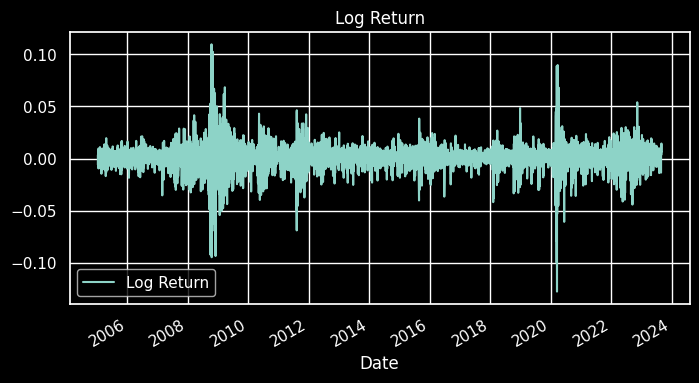

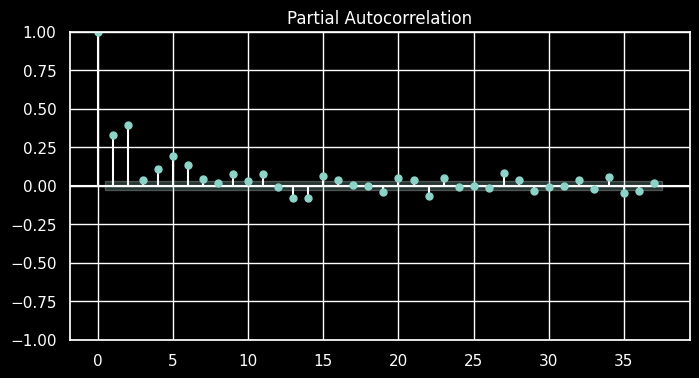

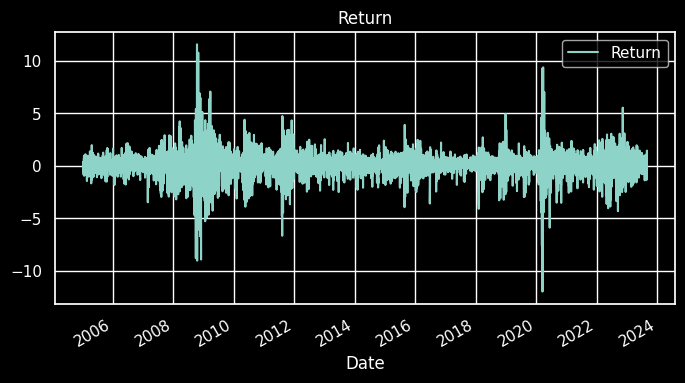

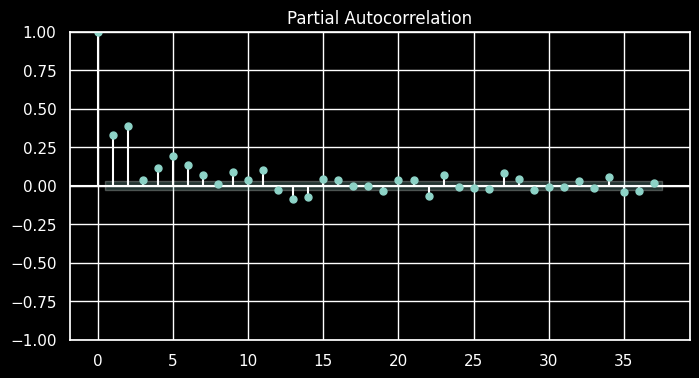

In [ ]:
#@title toggle

train_data["Log_Return"].plot(label='Log Return')
plt.legend()
plt.title('Log Return')
plt.show()

plot_pacf(train_data["Log_Return"]**2)
plt.show()


train_data["Return"].plot(label='Return')
plt.title('Return')
plt.legend()
plt.show()

plot_pacf(train_data["Return"]**2) #.plot(label='Squared Return')
plt.show()

In [ ]:
model = arch_model(train_data["Return"], p=2, q=2)

In [ ]:
model_fit = model.fit()

Iteration:      1,   Func. Count:      8,   Neg. LLF: 63284.455147565255
Iteration:      2,   Func. Count:     20,   Neg. LLF: 78303.27175537303
Iteration:      3,   Func. Count:     31,   Neg. LLF: 10397.410703200756
Iteration:      4,   Func. Count:     40,   Neg. LLF: 8475.697631461371
Iteration:      5,   Func. Count:     49,   Neg. LLF: 6438.773400378093
Iteration:      6,   Func. Count:     57,   Neg. LLF: 6348.303121343251
Iteration:      7,   Func. Count:     66,   Neg. LLF: 6282.572454747811
Iteration:      8,   Func. Count:     74,   Neg. LLF: 6281.237163932998
Iteration:      9,   Func. Count:     82,   Neg. LLF: 6282.364027738384
Iteration:     10,   Func. Count:     90,   Neg. LLF: 6280.180649075003
Iteration:     11,   Func. Count:     98,   Neg. LLF: 6279.804335561859
Iteration:     12,   Func. Count:    106,   Neg. LLF: 6279.745929644621
Iteration:     13,   Func. Count:    113,   Neg. LLF: 6279.745828056137
Iteration:     14,   Func. Count:    120,   Neg. LLF: 6279.745

In [ ]:
model_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                     Constant Mean - GARCH Model Results                      
==============================================================================
Dep. Variable:                 Return   R-squared:                       0.000
Mean Model:             Constant Mean   Adj. R-squared:                  0.000
Vol Model:                      GARCH   Log-Likelihood:               -6279.75
Distribution:                  Normal   AIC:                           12571.5
Method:            Maximum Likelihood   BIC:                           12610.2
                                        No. Observations:                 4692
Date:                Wed, Apr 10 2024   Df Residuals:                     4691
Time:                        19:46:31   Df Model:                            1
                                 Mean Model                                 
============================================================================
                 coef    std err          t      P>|t|      95.0% Conf. Int.
----------------------------------------------------------------------------
mu             0.0715  1.131e-02      6.321  2.591e-10 [4.931e-02,9.364e-02]
                              Volatility Model                              
============================================================================
                 coef    std err          t      P>|t|      95.0% Conf. Int.
----------------------------------------------------------------------------
omega          0.0484  1.000e-02      4.834  1.339e-06 [2.875e-02,6.796e-02]
alpha[1]       0.1003  2.260e-02      4.439  9.058e-06   [5.603e-02,  0.145]
alpha[2]       0.1419  2.167e-02      6.545  5.935e-11   [9.938e-02,  0.184]
beta[1]        0.1186      0.142      0.836      0.403     [ -0.160,  0.397]
beta[2]        0.6017      0.125      4.814  1.481e-06     [  0.357,  0.847]
============================================================================

Covariance estimator: robust
"""

In [ ]:
# rolling_predictions = []
# test_size = test_data.shape[0]

# for i in range(test_size):
#     train = test_data['Return'][:-(test_size-i)]
#     model = arch_model(train, p=2, q=2)
#     model_fit = model.fit(disp='off')
#     pred = model_fit.forecast(horizon=1)
#     rolling_predictions.append(np.sqrt(pred.variance.values[-1,:][0]))

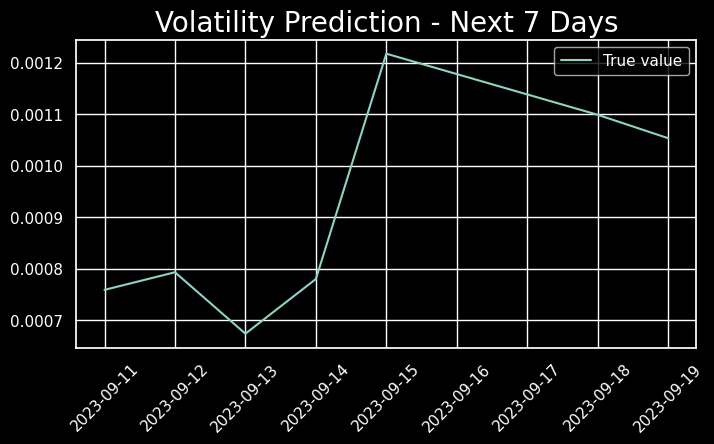

In [ ]:
from datetime import timedelta
horizon = 7
pred = model_fit.forecast(horizon=horizon)
future_dates = [test_data['Return'].index[0] + timedelta(days=i) for i in range(horizon)]
pred = pd.Series(np.sqrt(pred.variance.values[-1,:]), index=future_dates)

# plt.figure(figsize=(10,4))
# plt.plot(pred, label='Predicted')
plt.plot(test_data['Daily_Volatility'][:horizon], label='True value')
plt.legend()
plt.title('Volatility Prediction - Next 7 Days', fontsize=20)
plt.xticks(rotation=45)
plt.show()

# Copula for pair trading

In [ ]:
from scipy.optimize import brentq
from scipy.optimize import minimize_scalar
from scipy import stats
import numpy as np
import matplotlib.pyplot as plt

class Copula:
    '''
    Parent class for copulas
    '''

    # parameters for calculating probabilities numerically
    prob_sample_size = 10000000 # sample size
    prob_band = 0.005 # band size
    prob_sample = np.array([]) # sample

    def log_likelihood(self, u, v):
        '''
        Compute log likelihood for copula

        Args:
            u (numpy.ndarray): input (uniform) data with shape (n_samples,)
            v (numpy.ndarray): input (uniform) data with shape (n_samples,)

        Returns:
            numpy.ndarray: log likelihood (1,)
        '''
        return np.log(self.pdf(u,v)).sum()

    def cdf_u_given_v(self, u, v):
        '''
        Compute numberically conditional CDF P(U<=u|V=v)

        Args:
            u (numpy.ndarray): input (uniform) data with shape (1,)
            v (numpy.ndarray): input (uniform) data with shape (1,)

        Returns:
            numpy.ndarray: conditional CDF (1,)
        '''
        # generate sample if it does not exist
        if len(self.prob_sample) == 0:
            self.prob_sample = self.sample(size=self.prob_sample_size)
        # calculate conditional CDF
        s_u = self.prob_sample[:,0]
        s_v = self.prob_sample[:,1]
        condition = (s_v <= v+self.prob_band/2) & (s_v >= v-self.prob_band/2)
        sample_size = len(s_u[condition])
        prob = (s_u[condition] <= u).sum() / sample_size
        return prob

    def cdf_v_given_u(self, u, v):
        '''
        Compute numberically conditional CDF P(V<=v|U=u)

        Args:
            u (numpy.ndarray): input (uniform) data with shape (1,)
            v (numpy.ndarray): input (uniform) data with shape (1,)

        Returns:
            numpy.ndarray: conditional CDF (1,)
        '''
        # generate sample if it does not exist
        if len(self.prob_sample) == 0:
            self.prob_sample = self.sample(size=self.prob_sample_size)
        # calculate conditional CDF
        s_u = self.prob_sample[:,0]
        s_v = self.prob_sample[:,1]
        condition = (s_u <= u+self.prob_band/2) & (s_u >= u-self.prob_band/2)
        sample_size = len(s_v[condition])
        prob = (s_v[condition] <= v).sum() / sample_size
        return prob

    def plot_sample(self, size=10000):
        '''
        Generate and plot a sample from copula

        Args:
            size (int): sample size
        '''

        # generate sample
        sample = self.sample(size=size)
        u = sample[:,0]
        v = sample[:,1]
        # plot
        fig, ax = plt.subplots(figsize=(18,4), nrows=1, ncols=3)
        ax[0].hist(u, density=True)
        ax[0].set(title='Historgram of U')
        ax[1].hist(v, density=True)
        ax[1].set(title='Historgram of V')
        ax[2].scatter(u, v, alpha=0.2)
        ax[2].set(title='Scatterplot of U and V', xlabel='U', ylabel='V')

    def plot_with_data(self, u, v):
        '''
        Generate a sample from copula and plot it together with provided (transformed) data u, v

        Args:
            u (numpy.ndarray): input (uniform) data with shape (n_samples,)
            v (numpy.ndarray): input (uniform) data with shape (n_samples,)
        '''
        # generate sample
        size = len(x)
        sample = self.sample(size=size)
        s_u = sample[:,0]
        s_v = sample[:,1]
        # plot
        fig, ax = plt.subplots(figsize=(18,4), nrows=1, ncols=3)
        ax[0].scatter(u, v, alpha=0.2, c='tab:orange', label='real')
        ax[0].legend()
        ax[1].scatter(s_u, s_v, alpha=0.2, c='tab:blue', label='generated')
        ax[1].legend()
        ax[2].scatter(u, v, alpha=0.2, c='tab:orange', label='real')
        ax[2].scatter(s_u, s_v, alpha=0.2, c='tab:blue', label='generated')
        ax[2].legend()

class GaussianCopula(Copula):
    '''
     Class for bivariate Gaussian copula
    '''
    name = 'Gaussian'
    num_params = 1

    def __init__(self, rho=0):
        '''
        Initialize Gaussian copula object

        Args:
            rho: copula parameter rho
        '''
        self.rho = rho
        self.cov = np.array([[1,rho],[rho,1]])

    def cdf(self, u, v):
        '''
        Compute CDF for Gaussian copula

        Args:
            u (numpy.ndarray): input (uniform) data with shape (n_samples,)
            v (numpy.ndarray): input (uniform) data with shape (n_samples,)

        Returns:
            numpy.ndarray: cumulative probability (n_samples,)
        '''
        data = np.vstack([stats.norm.ppf(u),stats.norm.ppf(v)]).T

        return stats.multivariate_normal(cov=self.cov).cdf(data)

    def pdf(self, u, v):
        '''
        Compute PDF for Gaussian copula

        Args:
            u (numpy.ndarray): input (uniform) data with shape (n_samples,)
            v (numpy.ndarray): input (uniform) data with shape (n_samples,)

        Returns:
            numpy.ndarray: probability density (n_samples,)
        '''
        #data = np.vstack([[stats.norm.ppf(u),stats.norm.ppf(v)]]).T

        #return stats.multivariate_normal(cov=self.cov).pdf(data)

        from scipy.special import erfinv

        a = np.sqrt(2) * erfinv(2*u - 1)
        b = np.sqrt(2) * erfinv(2*u - 1)

        n1 = 1/np.sqrt(1-self.rho**2)
        n2 = np.exp(-((a**2+b**2)*self.rho**2 - 2*a*b*self.rho)/ 2*(1-self.rho**2))

        return  n1*n2


    def fit(self, u, v):
        '''
        Fit Gaussian copula to data

        Args:
            u (numpy.ndarray): input (uniform) data with shape (n_samples,)
            v (numpy.ndarray): input (uniform) data with shape (n_samples,)
        '''
        tau = stats.kendalltau(u,v)[0]
        self.rho = np.sin(tau * np.pi/2)
        self.cov = np.array([[1,self.rho],[self.rho,1]])

    def sample(self, size=1):
        '''
        Generate sample from Gaussian copula

        Args:
            size (int): sample size

        Returns:
            numpy.ndarray: sample (size,2)
        '''
        smp = stats.multivariate_normal(cov=self.cov).rvs(size=size)
        u = stats.norm.cdf(smp[:,0])
        v = stats.norm.cdf(smp[:,1])
        sample = np.vstack([u,v]).T

        return sample

class ArchimedeanCopula(Copula):
    '''
    Parent class for Archimedean copulas
    '''

    def sample(self, size=1):
        '''
        Generate sample from Archimedean copula using Kendall distribution function

        Args:
            size (int): sample size

        Returns:
            numpy.ndarray: sample (size,2)
        '''
        # step 1
        t1 = np.random.rand(size)
        t2 = np.random.rand(size)

        # steps 2 and 3
        w = []
        for t in t2:
            func = lambda w: self.K(w) - t
            w.append(brentq(func, 0.0000000001, 0.9999999999))
        w = np.array(w).flatten()

        # step 4
        u = self.phi_inv(t1 * self.phi(w))
        v = self.phi_inv((1-t1) * self.phi(w))
        sample = np.vstack([u,v]).T

        return sample

class ClaytonCopula(ArchimedeanCopula):
    '''
     Class for bivariate Clayton copula
    '''

    name = 'Clayton'
    alpha_bounds = (-1,20)
    num_params = 1

    def __init__(self, alpha=-1):
        '''
        Initialize Clayton copula object

        Args:
            alpha: copula parameter alpha
        '''
        self.alpha = alpha

    def phi(self, t):
        '''
        Compute generator function for Clayton copula

        Args:
            t (numpy.ndarray): input data with shape (n_samples,)

        Returns:
            numpy.ndarray: value of generator function (n_samples,)
        '''
        alpha = self.alpha
        return 1/alpha * (t**(-alpha) - 1)

    def phi_inv(self, t):
        '''
        Compute inverse generator function for Clayton copula

        Args:
            t (numpy.ndarray): input data with shape (n_samples,)

        Returns:
            numpy.ndarray: value of inverse generator function (n_samples,)
        '''
        alpha = self.alpha
        return (alpha * t + 1)**(-1/alpha)

    def K(self, t):
        '''
        Compute Kendall distribution function for Clayton copula

        Args:
            t (numpy.ndarray): input data with shape (n_samples,)

        Returns:
            numpy.ndarray: value of Kendall distribution function (n_samples,)
        '''
        alpha = self.alpha
        return t * (alpha - t**alpha + 1) / alpha


    def cdf(self, u, v):
        '''
        Compute CDF for Clayton copula

        Args:
            u (numpy.ndarray): input (uniform) data with shape (n_samples,)
            v (numpy.ndarray): input (uniform) data with shape (n_samples,)

        Returns:
            numpy.ndarray: cumulative probability (n_samples,)
        '''
        alpha=self.alpha
        return (u**(-alpha) + v**(-alpha) - 1)**(-1/alpha)

    def pdf(self, u, v):
        '''
        Compute PDF for Clayton copula

        Args:
            u (numpy.ndarray): input (uniform) data with shape (n_samples,)
            v (numpy.ndarray): input (uniform) data with shape (n_samples,)

        Returns:
            numpy.ndarray: probability density (n_samples,)
        '''
        alpha=self.alpha
        num = (u**(-alpha) * v**(-alpha) * (alpha+1) * (-1 + v**(-alpha) + u**(-alpha))**(-1/alpha))
        denom = u * v * (-1 + v**(-alpha) + u**(-alpha))**2
        return num/denom

    def fit(self, u, v, method='cml'):
        '''
        Fit Clayton copula to data

        Args:
            x (numpy.ndarray): input (uniform) data with shape (n_samples,)
            y (numpy.ndarray): input (uniform) data with shape (n_samples,)
        '''
        if method=='tau':
            tau = stats.kendalltau(u,v)[0]
            self.alpha = 2 * tau / (1 - tau)
        elif method=='cml':
            def fn_to_minimize(alpha, u, v):
                self.alpha = alpha
                return -self.log_likelihood(u,v)
            self.alpha = minimize_scalar(fn_to_minimize, args=(u, v),
                                         bounds=self.alpha_bounds, method='bounded')['x']

class GumbelCopula(ArchimedeanCopula):
    '''
     Class for bivariate Gumbel copula
    '''

    name = 'Gumbel'
    alpha_bounds = (-1,20)
    num_params = 1

    def __init__(self, alpha=-1):
        '''
        Initialize Gumbel copula object

        Args:
            alpha: copula parameter alpha
        '''
        self.alpha = alpha

    def phi(self, t):
        '''
        Compute generator function for Gumbel copula

        Args:
            t (numpy.ndarray): input data with shape (n_samples,)

        Returns:
            numpy.ndarray: value of generator function (n_samples,)
        '''
        alpha = self.alpha
        return (-np.log(t))**alpha

    def phi_inv(self, t):
        '''
        Compute inverse generator function for Gumbel copula

        Args:
            t (numpy.ndarray): input data with shape (n_samples,)

        Returns:
            numpy.ndarray: value of inverse generator function (n_samples,)
        '''
        alpha = self.alpha
        return np.exp(-t**(1/alpha))

    def K(self, t):
        '''
        Compute Kendall distribution function for Gumbel copula

        Args:
            t (numpy.ndarray): input data with shape (n_samples,)

        Returns:
            numpy.ndarray: value of Kendall distribution function (n_samples,)
        '''
        alpha = self.alpha
        return t * (alpha - np.log(t)) / alpha

    def cdf(self, u, v):
        '''
        Compute CDF for Gumbel copula

        Args:
            u (numpy.ndarray): input (uniform) data with shape (n_samples,)
            v (numpy.ndarray): input (uniform) data with shape (n_samples,)

        Returns:
            numpy.ndarray: cumulative probability (n_samples,)
        '''
        alpha=self.alpha
        return np.exp(-((-np.log(u))**alpha + (-np.log(v))**alpha) ** (1/alpha))

    def pdf(self, u, v):
        '''
        Compute PDF for Gumbel copula

        Args:
            u (numpy.ndarray): input (uniform) data with shape (n_samples,)
            v (numpy.ndarray): input (uniform) data with shape (n_samples,)

        Returns:
            numpy.ndarray: probability density (n_samples,)
        '''
        alpha=self.alpha
        num1 = (-np.log(u))**alpha * (-np.log(v))**alpha * ((-np.log(u))**alpha + (-np.log(v))**alpha)**(1/alpha)
        num2 = alpha + ((-np.log(u))**alpha + (-np.log(v))**alpha)**(1/alpha) - 1
        num3 = np.exp(-((-np.log(u))**alpha + (-np.log(v))**alpha)**(1/alpha))
        denom = u * v * ((-np.log(u))**alpha + (-np.log(v))**alpha)**2 * np.log(u) * np.log(v)

        return (num1 * num2 * num3) / denom

    def fit(self, u, v, method='cml'):
        '''
        Fit Gumbel copula to data

        Args:
            x (numpy.ndarray): input (uniform) data with shape (n_samples,)
            y (numpy.ndarray): input (uniform) data with shape (n_samples,)
        '''
        if method=='tau':
            tau = stats.kendalltau(u,v)[0]
            self.alpha = 1 / (1 - tau)
        elif method=='cml':
            def fn_to_minimize(alpha, u, v):
                self.alpha = alpha
                return -self.log_likelihood(u,v)
            self.alpha = minimize_scalar(fn_to_minimize, args=(u, v),
                                         bounds=self.alpha_bounds, method='bounded')['x']

class FrankCopula(ArchimedeanCopula):
    '''
     Class for bivariate Frank copula
    '''

    name = 'Frank'
    alpha_bounds = (-20,20)
    num_params = 1

    def __init__(self, alpha=-1):
        '''
        Initialize Frank copula object

        Args:
            alpha: copula parameter alpha
        '''
        self.alpha = alpha

    def phi(self, t):
        '''
        Compute generator function for Frank copula

        Args:
            t (numpy.ndarray): input data with shape (n_samples,)

        Returns:
            numpy.ndarray: value of generator function (n_samples,)
        '''
        alpha = self.alpha
        return -np.log((np.exp(-alpha*t) - 1) / (np.exp(-alpha) - 1))

    def phi_inv(self, t):
        '''
        Compute inverse generator function for Frank copula

        Args:
            t (numpy.ndarray): input data with shape (n_samples,)

        Returns:
            numpy.ndarray: value of inverse generator function (n_samples,)
        '''
        alpha = self.alpha
        return -1/alpha * np.log((np.exp(-alpha) - 1) / np.exp(t) + 1)

    def K(self, t):
        '''
        Compute Kendall distribution function for Frank copula

        Args:
            t (numpy.ndarray): input data with shape (n_samples,)

        Returns:
            numpy.ndarray: value of Kendall distribution function (n_samples,)
        '''
        alpha = self.alpha
        return (t + (1 - np.exp(alpha*t)) * np.log((1-np.exp(alpha*t)) *
                                               np.exp(-alpha*t+alpha) / (1-np.exp(alpha))) / alpha)

    def cdf(self, u, v):
        '''
        Compute CDF for Frank copula

        Args:
            u (numpy.ndarray): input (uniform) data with shape (n_samples,)
            v (numpy.ndarray): input (uniform) data with shape (n_samples,)

        Returns:
            numpy.ndarray: cumulative probability (n_samples,)
        '''
        alpha=self.alpha
        return -1/alpha * np.log(1 + (np.exp(-alpha*u)-1) * (np.exp(-alpha*v)-1) / (np.exp(-alpha)-1))

    def pdf(self, u, v):
        '''
        Compute PDF for Frank copula

        Args:
            u (numpy.ndarray): input (uniform) data with shape (n_samples,)
            v (numpy.ndarray): input (uniform) data with shape (n_samples,)

        Returns:
            numpy.ndarray: probability density (n_samples,)
        '''
        alpha=self.alpha
        num = alpha * (np.exp(alpha) - 1) * np.exp(alpha * (u + v + 1))
        denom = (-(np.exp(alpha) - 1) * np.exp(alpha * (u + v)) +
                 (np.exp(alpha*u)-1) * (np.exp(alpha*v)-1) * np.exp(alpha))**2
        return num/denom

    def fit(self, u, v, method='cml'):
        '''
        Fit Frank copula to data

        Args:
            x (numpy.ndarray): input (uniform) data with shape (n_samples,)
            y (numpy.ndarray): input (uniform) data with shape (n_samples,)
        '''
        if method=='tau':
            raise NotImplementedError
        elif method=='cml':
            def fn_to_minimize(alpha, u, v):
                self.alpha = alpha
                return -self.log_likelihood(u,v)
            self.alpha = minimize_scalar(fn_to_minimize, args=(u, v),
                                         bounds=self.alpha_bounds, method='bounded')['x']

class JoeCopula(ArchimedeanCopula):
    '''
     Class for bivariate Joe copula
    '''

    name = 'Joe'
    alpha_bounds = (1,20)
    num_params = 1

    def __init__(self, alpha=1):
        '''
        Initialize Joe copula object

        Args:
            alpha: copula parameter alpha
        '''
        self.alpha = alpha

    def phi(self, t):
        '''
        Compute generator function for Joe copula

        Args:
            t (numpy.ndarray): input data with shape (n_samples,)

        Returns:
            numpy.ndarray: value of generator function (n_samples,)
        '''
        alpha = self.alpha
        return -np.log(1 - (1-t)**alpha)

    def phi_inv(self, t):
        '''
        Compute inverse generator function for Joe copula

        Args:
            t (numpy.ndarray): input data with shape (n_samples,)

        Returns:
            numpy.ndarray: value of inverse generator function (n_samples,)
        '''
        alpha = self.alpha
        return 1 - (1 - np.exp(-t))**(1/alpha)

    def K(self, t):
        '''
        Compute Kendall distribution function for Joe copula

        Args:
            t (numpy.ndarray): input data with shape (n_samples,)

        Returns:
            numpy.ndarray: value of Kendall distribution function (n_samples,)
        '''
        alpha = self.alpha
        return (1/alpha * (1-t)**(-alpha) * (alpha*t*(1-t)**alpha -
                                             (t-1) * ((1-t)**alpha-1) * np.log(1 - (1-t)**alpha)))

    def cdf(self, u, v):
        '''
        Compute CDF for Joe copula

        Args:
            u (numpy.ndarray): input (uniform) data with shape (n_samples,)
            v (numpy.ndarray): input (uniform) data with shape (n_samples,)

        Returns:
            numpy.ndarray: cumulative probability (n_samples,)
        '''
        alpha=self.alpha
        return 1 - ((1-u)**alpha + (1-v)**alpha - (1-u)**alpha * (1-v)**alpha) ** (1/alpha)

    def pdf(self, u, v):
        '''
        Compute PDF for Joe copula

        Args:
            u (numpy.ndarray): input (uniform) data with shape (n_samples,)
            v (numpy.ndarray): input (uniform) data with shape (n_samples,)

        Returns:
            numpy.ndarray: probability density (n_samples,)
        '''
        alpha = self.alpha

        # fix numerical issues:
        u[u==1] = 0.999999999
        u[u==0] = 0.000000001
        v[v==1] = 0.999999999
        v[v==0] = 0.000000001

        n1 = (1-u)**(alpha-1) * (1-v)**(alpha-1)
        n2 = (-(1-u)**alpha * (1-v)**alpha + (1-u)**alpha + (1-v)**alpha) ** (-2 + 1/alpha)
        n3 = (alpha * ((1-u)**alpha - 1) * ((1-v)**alpha - 1) + alpha*(-(1-u)**alpha * (1-v)**alpha +
                (1-u)**alpha + (1-v)**alpha) - ((1-u)**alpha-1) * ((1-v)**alpha - 1))
        return n1 * n2 * n3

    def fit(self, u, v, method='cml'):
        '''
        Fit Joe copula to data

        Args:
            x (numpy.ndarray): input (uniform) data with shape (n_samples,)
            y (numpy.ndarray): input (uniform) data with shape (n_samples,)
        '''
        if method=='tau':
            raise NotImplementedError
        elif method=='cml':
            def fn_to_minimize(alpha, u, v):
                self.alpha = alpha
                return -self.log_likelihood(u,v)
            self.alpha = minimize_scalar(fn_to_minimize, args=(u, v),
                                         bounds=self.alpha_bounds, method='bounded')['x']

class N13Copula(ArchimedeanCopula):
    '''
     Class for bivariate N13 copula
    '''

    name = 'N13'
    alpha_bounds = (0,20)
    num_params = 1

    def __init__(self, alpha=1):
        '''
        Initialize N13 copula object

        Args:
            alpha: copula parameter alpha
        '''
        self.alpha = alpha

    def phi(self, t):
        '''
        Compute generator function for N13 copula

        Args:
            t (numpy.ndarray): input data with shape (n_samples,)

        Returns:
            numpy.ndarray: value of generator function (n_samples,)
        '''
        alpha = self.alpha
        return (1 - np.log(t))**alpha - 1

    def phi_inv(self, t):
        '''
        Compute inverse generator function for N13 copula

        Args:
            t (numpy.ndarray): input data with shape (n_samples,)

        Returns:
            numpy.ndarray: value of inverse generator function (n_samples,)
        '''
        alpha = self.alpha
        return np.exp(1 - (t+1)**(1/alpha))

    def K(self, t):
        '''
        Compute Kendall distribution function for N13 copula

        Args:
            t (numpy.ndarray): input data with shape (n_samples,)

        Returns:
            numpy.ndarray: value of Kendall distribution function (n_samples,)
        '''
        alpha = self.alpha
        return (t/alpha * (1-np.log(t))**(-alpha) * (alpha * (1-np.log(t))**alpha -
                                                ((1-np.log(t))**alpha - 1) * (np.log(t) - 1)))

    def cdf(self, u, v):
        '''
        Compute CDF for N13 copula

        Args:
            u (numpy.ndarray): input (uniform) data with shape (n_samples,)
            v (numpy.ndarray): input (uniform) data with shape (n_samples,)

        Returns:
            numpy.ndarray: cumulative probability (n_samples,)
        '''
        alpha=self.alpha
        return np.exp(1 - ((1-np.log(u))**alpha + (1-np.log(v))**alpha - 1) ** (1/alpha))

    def pdf(self, u, v):
        '''
        Compute PDF for N13 copula

        Args:
            u (numpy.ndarray): input (uniform) data with shape (n_samples,)
            v (numpy.ndarray): input (uniform) data with shape (n_samples,)

        Returns:
            numpy.ndarray: probability density (n_samples,)
        '''
        alpha = self.alpha

        n1 = (1-np.log(u))**alpha * (1-np.log(v))**alpha
        n2 = (alpha + ((1-np.log(u))**alpha + (1-np.log(v))**alpha - 1) ** (1/alpha) - 1)
        n3 = ((1-np.log(u))**alpha + (1-np.log(v))**alpha - 1) ** (1/alpha)
        n4 = np.exp(1 - ((1-np.log(u))**alpha + (1-np.log(v))**alpha - 1) ** (1/alpha))
        d = u * v * (np.log(u)-1) * (np.log(v)-1) * ((1-np.log(u))**alpha + (1-np.log(v))**alpha - 1)**2

        return n1*n2*n3*n4 / d

    def fit(self, u, v, method='cml'):
        '''
        Fit N13 copula to data

        Args:
            x (numpy.ndarray): input (uniform) data with shape (n_samples,)
            y (numpy.ndarray): input (uniform) data with shape (n_samples,)
        '''
        if method=='tau':
            raise NotImplementedError
        elif method=='cml':
            def fn_to_minimize(alpha, u, v):
                self.alpha = alpha
                return -self.log_likelihood(u,v)
            self.alpha = minimize_scalar(fn_to_minimize, args=(u, v),
                                         bounds=self.alpha_bounds, method='bounded')['x']

class N14Copula(ArchimedeanCopula):
    '''
     Class for bivariate N14 copula
    '''

    name = 'N14'
    alpha_bounds = (1,20)
    num_params = 1

    def __init__(self, alpha=1):
        '''
        Initialize N14 copula object

        Args:
            alpha: copula parameter alpha
        '''
        self.alpha = alpha

    def phi(self, t):
        '''
        Compute generator function for N14 copula

        Args:
            t (numpy.ndarray): input data with shape (n_samples,)

        Returns:
            numpy.ndarray: value of generator function (n_samples,)
        '''
        alpha = self.alpha
        return (t**(-1/alpha) - 1)**alpha

    def phi_inv(self, t):
        '''
        Compute inverse generator function for N14 copula

        Args:
            t (numpy.ndarray): input data with shape (n_samples,)

        Returns:
            numpy.ndarray: value of inverse generator function (n_samples,)
        '''
        alpha = self.alpha
        return (t**(1/alpha) + 1)**(-alpha)

    def K(self, t):
        '''
        Compute Kendall distribution function for N14 copula

        Args:
            t (numpy.ndarray): input data with shape (n_samples,)

        Returns:
            numpy.ndarray: value of Kendall distribution function (n_samples,)
        '''
        alpha = self.alpha
        return t * (2 - t**(1/alpha))

    def cdf(self, u, v):
        '''
        Compute CDF for N14 copula

        Args:
            u (numpy.ndarray): input (uniform) data with shape (n_samples,)
            v (numpy.ndarray): input (uniform) data with shape (n_samples,)

        Returns:
            numpy.ndarray: cumulative probability (n_samples,)
        '''
        alpha=self.alpha
        return (1 + ((u**(-1/alpha)-1)**alpha + (v**(-1/alpha)-1)**alpha)**(1/alpha))**(-alpha)

    def pdf(self, u, v):
        '''
        Compute PDF for N14 copula

        Args:
            u (numpy.ndarray): input (uniform) data with shape (n_samples,)
            v (numpy.ndarray): input (uniform) data with shape (n_samples,)

        Returns:
            numpy.ndarray: probability density (n_samples,)
        '''
        alpha = self.alpha

        # fix numerical issues:
        #u[u==1] = 0.999999999
        #u[u==0] = 0.000000001
        #v[v==1] = 0.999999999
        #v[v==0] = 0.000000001

        a = u**(-1/alpha) * (1 - u**(1/alpha))
        b = v**(-1/alpha) * (1 - v**(1/alpha))
        n1 = (a**alpha * b**alpha * (a**alpha + b**alpha)**((1-2*alpha)/alpha) *
              ((a**alpha + b**alpha)**(1/alpha) + 1)**(-2-alpha))
        n2 = alpha * (a**alpha + b**alpha)**(1/alpha) + alpha * ((a**alpha + b**alpha)**(1/alpha) + 1) - 1
        d = alpha * u * v * (u**(1/alpha) - 1) * (v**(1/alpha) - 1)

        return n1 * n2 / d


    def fit(self, u, v, method='cml'):
        '''
        Fit N14 copula to data

        Args:
            x (numpy.ndarray): input (uniform) data with shape (n_samples,)
            y (numpy.ndarray): input (uniform) data with shape (n_samples,)
        '''
        if method=='tau':
            raise NotImplementedError
        elif method=='cml':
            def fn_to_minimize(alpha, u, v):
                self.alpha = alpha
                return -self.log_likelihood(u,v)
            self.alpha = minimize_scalar(fn_to_minimize, args=(u, v),
                                         bounds=self.alpha_bounds, method='bounded')['x']


In [ ]:
from __future__ import division
import numpy as np
from numpy import random
from scipy.spatial.distance import pdist, cdist
from scipy.stats import kstwobign, pearsonr
from scipy.stats import genextreme

__all__ = ['ks2d2s', 'estat', 'estat2d']


def ks2d2s(x1, y1, x2, y2, nboot=None, extra=False):
    '''Two-dimensional Kolmogorov-Smirnov test on two samples.
    Parameters
    ----------
    x1, y1 : ndarray, shape (n1, )
        Data of sample 1.
    x2, y2 : ndarray, shape (n2, )
        Data of sample 2. Size of two samples can be different.
    nboot : None or int
        Number of bootstrap resample to estimate the p-value. A large number is expected.
        If None, an approximate analytic estimate will be used.
    extra: bool, optional
        If True, KS statistic is also returned. Default is False.

    Returns
    -------
    p : float
        Two-tailed p-value.
    D : float, optional
        KS statistic, returned if keyword `extra` is True.

    Notes
    -----
    This is the two-sided K-S test. Small p-values means that the two samples are significantly different.
    Note that the p-value is only an approximation as the analytic distribution is unkonwn. The approximation
    is accurate enough when N > ~20 and p-value < ~0.20 or so. When p-value > 0.20, the value may not be accurate,
    but it certainly implies that the two samples are not significantly different. (cf. Press 2007)

    References
    ----------
    Peacock, J.A. 1983, Two-Dimensional Goodness-of-Fit Testing in Astronomy, MNRAS, 202, 615-627
    Fasano, G. and Franceschini, A. 1987, A Multidimensional Version of the Kolmogorov-Smirnov Test, MNRAS, 225, 155-170
    Press, W.H. et al. 2007, Numerical Recipes, section 14.8

    '''
    assert (len(x1) == len(y1)) and (len(x2) == len(y2))
    n1, n2 = len(x1), len(x2)
    D = avgmaxdist(x1, y1, x2, y2)

    if nboot is None:
        sqen = np.sqrt(n1 * n2 / (n1 + n2))
        r1 = pearsonr(x1, y1)[0]
        r2 = pearsonr(x2, y2)[0]
        r = np.sqrt(1 - 0.5 * (r1**2 + r2**2))
        d = D * sqen / (1 + r * (0.25 - 0.75 / sqen))
        p = kstwobign.sf(d)
    else:
        n = n1 + n2
        x = np.concatenate([x1, x2])
        y = np.concatenate([y1, y2])
        d = np.empty(nboot, 'f')
        for i in range(nboot):
            idx = random.choice(n, n, replace=True)
            ix1, ix2 = idx[:n1], idx[n1:]
            #ix1 = random.choice(n, n1, replace=True)
            #ix2 = random.choice(n, n2, replace=True)
            d[i] = avgmaxdist(x[ix1], y[ix1], x[ix2], y[ix2])
        p = np.sum(d > D).astype('f') / nboot
    if extra:
        return p, D
    else:
        return p


def avgmaxdist(x1, y1, x2, y2):
    D1 = maxdist(x1, y1, x2, y2)
    D2 = maxdist(x2, y2, x1, y1)
    return (D1 + D2) / 2


def maxdist(x1, y1, x2, y2):
    n1 = len(x1)
    D1 = np.empty((n1, 4))
    for i in range(n1):
        a1, b1, c1, d1 = quadct(x1[i], y1[i], x1, y1)
        a2, b2, c2, d2 = quadct(x1[i], y1[i], x2, y2)
        D1[i] = [a1 - a2, b1 - b2, c1 - c2, d1 - d2]

    # re-assign the point to maximize difference,
    # the discrepancy is significant for N < ~50
    D1[:, 0] -= 1 / n1

    dmin, dmax = -D1.min(), D1.max() + 1 / n1
    return max(dmin, dmax)


def quadct(x, y, xx, yy):
    n = len(xx)
    ix1, ix2 = xx <= x, yy <= y
    a = np.sum(ix1 & ix2) / n
    b = np.sum(ix1 & ~ix2) / n
    c = np.sum(~ix1 & ix2) / n
    d = 1 - a - b - c
    return a, b, c, d


def estat2d(x1, y1, x2, y2, **kwds):
    return estat(np.c_[x1, y1], np.c_[x2, y2], **kwds)


def estat(x, y, nboot=1000, replace=False, method='log', fitting=False):
    '''
    Energy distance statistics test.
    Reference
    ---------
    Aslan, B, Zech, G (2005) Statistical energy as a tool for binning-free
      multivariate goodness-of-fit tests, two-sample comparison and unfolding.
      Nuc Instr and Meth in Phys Res A 537: 626-636
    Szekely, G, Rizzo, M (2014) Energy statistics: A class of statistics
      based on distances. J Stat Planning & Infer 143: 1249-1272
    Brian Lau, multdist, https://github.com/brian-lau/multdist

    '''
    n, N = len(x), len(x) + len(y)
    stack = np.vstack([x, y])
    stack = (stack - stack.mean(0)) / stack.std(0)
    if replace:
        rand = lambda x: random.randint(x, size=x)
    else:
        rand = random.permutation

    en = energy(stack[:n], stack[n:], method)
    en_boot = np.zeros(nboot, 'f')
    for i in range(nboot):
        idx = rand(N)
        en_boot[i] = energy(stack[idx[:n]], stack[idx[n:]], method)

    if fitting:
        param = genextreme.fit(en_boot)
        p = genextreme.sf(en, *param)
        return p, en, param
    else:
        p = (en_boot >= en).sum() / nboot
        return p, en, en_boot


def energy(x, y, method='log'):
    dx, dy, dxy = pdist(x), pdist(y), cdist(x, y)
    n, m = len(x), len(y)
    if method == 'log':
        dx, dy, dxy = np.log(dx), np.log(dy), np.log(dxy)
    elif method == 'gaussian':
        raise NotImplementedError
    elif method == 'linear':
        pass
    else:
        raise ValueError
    z = dxy.sum() / (n * m) - dx.sum() / n**2 - dy.sum() / m**2
    # z = ((n*m)/(n+m)) * z # ref. SR
    return z

In [ ]:
from pandas_datareader import data

def get(tickers, start, end):
    def multiple(ticker):
        return yf.download(ticker, start, end, progress=False)
    datas = map(multiple, tickers)
    return pd.concat(datas, keys=tickers,names=['Ticker', 'Date'])

In [ ]:
tickers = ["^GSPC","^RUT"]
start = pd.to_datetime('2018-01-01')
end = pd.to_datetime('2024-03-21')
df = get(tickers, start, end)
adj_close = df.reset_index().pivot(columns=['Date','Ticker','Adj Close'])
returns = np.log(adj_close).diff().dropna()
returns

/usr/local/lib/python3.10/dist-packages/pandas/core/internals/blocks.py:329: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)


Empty DataFrame
Columns: [(Open, 2018-01-02 00:00:00, ^GSPC, 2695.81005859375), (Open, 2018-01-03 00:00:00, ^GSPC, 2713.06005859375), (Open, 2018-01-04 00:00:00, ^GSPC, 2723.989990234375), (Open, 2018-01-05 00:00:00, ^GSPC, 2743.14990234375), (Open, 2018-01-08 00:00:00, ^GSPC, 2747.7099609375), (Open, 2018-01-09 00:00:00, ^GSPC, 2751.2900390625), (Open, 2018-01-10 00:00:00, ^GSPC, 2748.22998046875), (Open, 2018-01-11 00:00:00, ^GSPC, 2767.56005859375), (Open, 2018-01-12 00:00:00, ^GSPC, 2786.239990234375), (Open, 2018-01-16 00:00:00, ^GSPC, 2776.419921875), (Open, 2018-01-17 00:00:00, ^GSPC, 2802.56005859375), (Open, 2018-01-18 00:00:00, ^GSPC, 2798.030029296875), (Open, 2018-01-19 00:00:00, ^GSPC, 2810.300048828125), (Open, 2018-01-22 00:00:00, ^GSPC, 2832.969970703125), (Open, 2018-01-23 00:00:00, ^GSPC, 2839.1298828125), (Open, 2018-01-24 00:00:00, ^GSPC, 2837.5400390625), (Open, 2018-01-25 00:00:00, ^GSPC, 2839.25), (Open, 2018-01-26 00:00:00, ^GSPC, 2872.8701171875), (Open, 2018-01-29 00:00:00, ^GSPC, 2853.530029296875), (Open, 2018-01-30 00:00:00, ^GSPC, 2822.429931640625), (Open, 2018-01-31 00:00:00, ^GSPC, 2823.81005859375), (Open, 2018-02-01 00:00:00, ^GSPC, 2821.97998046875), (Open, 2018-02-02 00:00:00, ^GSPC, 2762.1298828125), (Open, 2018-02-05 00:00:00, ^GSPC, 2648.93994140625), (Open, 2018-02-06 00:00:00, ^GSPC, 2695.139892578125), (Open, 2018-02-07 00:00:00, ^GSPC, 2681.659912109375), (Open, 2018-02-08 00:00:00, ^GSPC, 2581.0), (Open, 2018-02-09 00:00:00, ^GSPC, 2619.550048828125), (Open, 2018-02-12 00:00:00, ^GSPC, 2656.0), (Open, 2018-02-13 00:00:00, ^GSPC, 2662.93994140625), (Open, 2018-02-14 00:00:00, ^GSPC, 2698.6298828125), (Open, 2018-02-15 00:00:00, ^GSPC, 2731.199951171875), (Open, 2018-02-16 00:00:00, ^GSPC, 2732.219970703125), (Open, 2018-02-20 00:00:00, ^GSPC, 2716.260009765625), (Open, 2018-02-21 00:00:00, ^GSPC, 2701.330078125), (Open, 2018-02-22 00:00:00, ^GSPC, 2703.9599609375), (Open, 2018-02-23 00:00:00, ^GSPC, 2747.300048828125), (Open, 2018-02-26 00:00:00, ^GSPC, 2779.60009765625), (Open, 2018-02-27 00:00:00, ^GSPC, 2744.280029296875), (Open, 2018-02-28 00:00:00, ^GSPC, 2713.830078125), (Open, 2018-03-01 00:00:00, ^GSPC, 2677.669921875), (Open, 2018-03-02 00:00:00, ^GSPC, 2691.25), (Open, 2018-03-05 00:00:00, ^GSPC, 2720.93994140625), (Open, 2018-03-06 00:00:00, ^GSPC, 2728.1201171875), (Open, 2018-03-07 00:00:00, ^GSPC, 2726.800048828125), (Open, 2018-03-08 00:00:00, ^GSPC, 2738.969970703125), (Open, 2018-03-09 00:00:00, ^GSPC, 2786.570068359375), (Open, 2018-03-12 00:00:00, ^GSPC, 2783.02001953125), (Open, 2018-03-13 00:00:00, ^GSPC, 2765.31005859375), (Open, 2018-03-14 00:00:00, ^GSPC, 2749.47998046875), (Open, 2018-03-15 00:00:00, ^GSPC, 2747.330078125), (Open, 2018-03-16 00:00:00, ^GSPC, 2752.010009765625), (Open, 2018-03-19 00:00:00, ^GSPC, 2712.919921875), (Open, 2018-03-20 00:00:00, ^GSPC, 2716.93994140625), (Open, 2018-03-21 00:00:00, ^GSPC, 2711.929931640625), (Open, 2018-03-22 00:00:00, ^GSPC, 2643.68994140625), (Open, 2018-03-23 00:00:00, ^GSPC, 2588.260009765625), (Open, 2018-03-26 00:00:00, ^GSPC, 2658.550048828125), (Open, 2018-03-27 00:00:00, ^GSPC, 2612.6201171875), (Open, 2018-03-28 00:00:00, ^GSPC, 2605.0), (Open, 2018-03-29 00:00:00, ^GSPC, 2640.8701171875), (Open, 2018-04-02 00:00:00, ^GSPC, 2581.8798828125), (Open, 2018-04-03 00:00:00, ^GSPC, 2614.449951171875), (Open, 2018-04-04 00:00:00, ^GSPC, 2644.68994140625), (Open, 2018-04-05 00:00:00, ^GSPC, 2662.840087890625), (Open, 2018-04-06 00:00:00, ^GSPC, 2604.469970703125), (Open, 2018-04-09 00:00:00, ^GSPC, 2613.159912109375), (Open, 2018-04-10 00:00:00, ^GSPC, 2656.8701171875), (Open, 2018-04-11 00:00:00, ^GSPC, 2642.18994140625), (Open, 2018-04-12 00:00:00, ^GSPC, 2663.989990234375), (Open, 2018-04-13 00:00:00, ^GSPC, 2656.300048828125), (Open, 2018-04-16 00:00:00, ^GSPC, 2677.840087890625), (Open, 2018-04-17 00:00:00, ^GSPC, 2706.389892578125), (Open, 2018-04-18 00:00:00, ^GSPC, 2708.639892578125), (Open, 2018-04-19 00

In [ ]:
(returns+1).cumprod().plot()
adj_close.plot()
plt.title('S&P 500 and Russel 2000')
plt.show()

In [ ]:

pair = ('^GSPC','^RUT')
s1,s2 = pair
copulas_df = pd.DataFrame(columns=['parameter', 'aic', 'bic', 'KS_pvalue'])

# fit marginals
params_s1 = stats.t.fit(returns[s1])
dist_s1 = stats.t(*params_s1)
params_s2 = stats.t.fit(returns[s2])
dist_s2 = stats.t(*params_s2)
# apply probability integral transform
u = dist_s1.cdf(returns[s1])
v = dist_s2.cdf(returns[s2])


#for copula in [GaussianMultivariate()]:
for copula in [GaussianCopula(), ClaytonCopula(), GumbelCopula(), FrankCopula(), JoeCopula()]:
    copula.fit(u,v)
    L = copula.log_likelihood(u,v)
    aic = 2 * copula.num_params - 2 * L
    bic = copula.num_params * np.log(len(u)) - 2 * L
    copula_name = copula.name

    # calculate KS-pvalue
    smp = copula.sample(size=len(u)) # generate sample from fit copula
    s_u = smp[:,0]
    s_v = smp[:,1]
    ks_pval = ks2d2s(u,v,s_u,s_v)

    if isinstance(copula, ArchimedeanCopula):
        best_param = copula.alpha
    else:
        best_param = copula.rho
    copulas_df.loc[copula_name] = [best_param, aic, bic, ks_pval]
copulas_df.to_csv('Copula_result.csv')
copulas_df

In [ ]:
tickers = ["^GSPC","^RUT"]
s1 = "^GSPC"
s2 = "^RUT"
start = pd.to_datetime('2007-01-01')
end = pd.to_datetime('2024-03-21')
df = get(tickers, start, end)
adj_close = df.reset_index().pivot('Date','Ticker','Adj Close')
returns_test = np.log(adj_close).diff().dropna()
returns_test

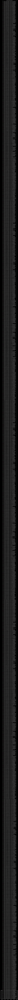

In [ ]:

adj_close.loc['2007-01-01':'2024-03-21',:].plot()
plt.title('S&P 500 and Russel 2000')
plt.show()

In [ ]:



def get_prob_trading(data_source,fitting_period,predicting_period,start,end):
    '''
    calculate conditional probability based on Copula joint distribution
    '''
    s1,s2 = data_source.columns
    all_time_index = data_source.index
    trading_time_index = data_source.loc[start:end].index
    end_loc = all_time_index.get_loc(trading_time_index[-1])
    prob_s1 = []
    prob_s2 = []
    for t in trading_time_index[::predicting_period]:
        start_loc = all_time_index.get_loc(t)
        fitting_return = data_source.iloc[start_loc-fitting_period:start_loc]
        predicting_return = data_source.iloc[start_loc:min(start_loc+predicting_period,end_loc+1)]

        # fit marginals
        params_s1 = stats.t.fit(fitting_return[s1])
        dist_s1 = stats.t(*params_s1)
        params_s2 = stats.t.fit(fitting_return[s2])
        dist_s2 = stats.t(*params_s2)

        # transform marginals
        u = dist_s1.cdf(fitting_return[s1])
        v = dist_s2.cdf(fitting_return[s2])

        copulas = GaussianCopula()
        copulas.fit(u,v)

        for u,v in zip(dist_s1.cdf(predicting_return[s1]), dist_s2.cdf(predicting_return[s2])):
            prob_s1.append(copulas.cdf_u_given_v(u,v))
            prob_s2.append(copulas.cdf_v_given_u(u,v))

    probs_trade = pd.DataFrame(np.vstack([prob_s1, prob_s2]).T, index=trading_time_index, columns=[s1, s2])
    return probs_trade

In [ ]:
def pair_strategy(data_source, probs_trade, cl, cl_close):
    s1 = probs_trade.columns[0]
    s2 = probs_trade.columns[1]

    positions = pd.DataFrame(index=probs_trade.index, columns=probs_trade.columns)
    long_ = False
    short = False

    # Pre-calculate conditions for opening and closing positions
    open_long_condition = (probs_trade[s1] < (1 - cl)) & (probs_trade[s2] > cl)
    open_short_condition = (probs_trade[s1] > cl) & (probs_trade[s2] < (1 - cl))
    close_long_condition = (probs_trade[s1] > (1 - cl_close)) | (probs_trade[s2] < cl_close)
    close_short_condition = (probs_trade[s1] < cl_close) | (probs_trade[s2] > (1 - cl_close))

    for t in positions.index:
        if long_:
            if close_long_condition.loc[t]:
                positions.loc[t] = [0, 0]
                long_ = False
            else:
                positions.loc[t] = [1, -1]

        elif short:
            if close_short_condition.loc[t]:
                positions.loc[t] = [0, 0]
                short = False
            else:
                positions.loc[t] = [-1, 1]

        else:
            if open_long_condition.loc[t]:
                positions.loc[t] = [1, -1]
                long_ = True
            elif open_short_condition.loc[t]:
                positions.loc[t] = [-1, 1]

    # Calculate returns
    returns_trade = data_source.loc[probs_trade.index]
    algo_returns = {}
    algo_ret = (returns_trade * positions.shift(1)).sum(axis=1)
    algo_returns['pair'] = algo_ret
    returns_df = pd.DataFrame.from_dict(algo_returns)
    returns_df = np.exp(returns_df) - 1  # Convert log-returns to simple returns
    total_ret = returns_df.sum(axis=1) / len(returns_df.columns) * 2  # Double capital (from short positions)

    a = pd.DataFrame(data={'algo': np.nancumprod(total_ret + 1),
                            s1: np.nancumprod(returns_trade[s1] + 1),
                            s2: np.nancumprod(returns_trade[s2] + 1)},
                     index=probs_trade.index)
    return a


In [ ]:
fitting_period = 500
predicting_period = 100
start = '2021-07-01'
end = '2024-01-07'
probs_trade = get_prob_trading(returns_test,fitting_period,predicting_period,start,end)

NameError: name 'returns_test' is not defined

In [ ]:
cl = 0.90
cl_close = 0.65
pair_strategy(returns_test,probs_trade,cl,cl_close).plot()

NameError: name 'returns_test' is not defined

In [ ]:

def calculate_metrics(cumret):
    '''
    calculate performance metrics from cumulative returns
    '''
    total_return = (cumret[-1] - cumret[0])/cumret[0]
    apr = (1+total_return)**(252/len(cumret)) - 1
    rets = pd.DataFrame(cumret).pct_change()
    sharpe = np.sqrt(252) * np.nanmean(rets) / np.nanstd(rets)

    # maxdd and maxddd
    highwatermark=np.zeros(cumret.shape)
    drawdown=np.zeros(cumret.shape)
    drawdownduration=np.zeros(cumret.shape)
    for t in np.arange(1, cumret.shape[0]):
        highwatermark[t]=np.maximum(highwatermark[t-1], cumret[t])
        drawdown[t]=cumret[t]/highwatermark[t]-1
        if drawdown[t]==0:
            drawdownduration[t]=0
        else:
            drawdownduration[t]=drawdownduration[t-1]+1
    maxDD=np.min(drawdown)
    maxDDD=np.max(drawdownduration)

    return total_return, apr, sharpe, maxDD

In [ ]:
total_ret = pair_strategy(returns_test,probs_trade,0.9,0.65)
metrics = pd.DataFrame(columns=['Total return', 'APR', 'Sharpe', 'MaxDD'])
metrics.loc['algo'] = calculate_metrics(total_ret['algo'])
metrics.loc['^GSPC'] = calculate_metrics(total_ret['^GSPC'])
metrics.loc['^RUT'] = calculate_metrics(total_ret['^RUT'])
metrics

##Hawks process


In [ ]:
import pandas as pd
import numpy as np
import pandas_ta as ta
import matplotlib.pyplot as plt
import scipy
import yfinance

def plot_two_axes(series1, *ex_series):
    plt.style.use('dark_background')
    ax = series1.plot(color='green')
    ax2 = ax.twinx()
    for i, series in enumerate(ex_series):
        series.plot(ax=ax2, alpha=0.5)
    #plt.show()

def hawkes_process(data: pd.Series,date, kappa: float):

    assert(kappa > 0.0)
    alpha = np.exp(-kappa)
    arr = data
    output = np.zeros(len(data))
    output[:] = np.nan
    for i in range(1, len(data)):
        if np.isnan(output[i - 1]):
            output[i] = arr[i]
        else:
            output[i] = output[i - 1] * alpha + arr[i]

    return pd.Series(output, date) * kappa

def vol_signal(close: pd.Series, vol_hawkes: pd.Series, lookback:int):
    signal = np.zeros(len(close))
    q05 = vol_hawkes.rolling(lookback).quantile(0.05)
    q95 = vol_hawkes.rolling(lookback).quantile(0.95)

    last_below = -1
    curr_sig = 0

    for i in range(len(signal)):
        if vol_hawkes.iloc[i] < q05.iloc[i]:
            last_below = i
            curr_sig = 0

        if vol_hawkes.iloc[i] > q95.iloc[i] \
           and vol_hawkes.iloc[i - 1] <= q95.iloc[i - 1] \
           and last_below > 0 :

            change = close.iloc[i] - close.iloc[last_below]
            if change > 0.0:
                curr_sig = 1
            else:
                curr_sig = -1
        signal[i] = curr_sig

    return signal

def get_trades_from_signal(data: pd.DataFrame, signal: np.array):
    # Gets trade entry and exit times from a signal
    # that has values of -1, 0, 1. Denoting short,flat,and long.
    # No position sizing.

    long_trades = []
    short_trades = []

    close_arr = data['close'].to_numpy()
    last_sig = 0.0
    open_trade = None
    idx = data.index
    for i in range(len(data)):
        if signal[i] == 1.0 and last_sig != 1.0: # Long entry
            if open_trade is not None:
                open_trade[2] = idx[i]
                open_trade[3] = close_arr[i]
                short_trades.append(open_trade)

            open_trade = [idx[i], close_arr[i], -1, np.nan]
        if signal[i] == -1.0  and last_sig != -1.0: # Short entry
            if open_trade is not None:
                open_trade[2] = idx[i]
                open_trade[3] = close_arr[i]
                long_trades.append(open_trade)

            open_trade = [idx[i], close_arr[i], -1, np.nan]

        if signal[i] == 0.0 and last_sig == -1.0: # Short exit
            open_trade[2] = idx[i]
            open_trade[3] = close_arr[i]
            short_trades.append(open_trade)
            open_trade = None

        if signal[i] == 0.0  and last_sig == 1.0: # Long exit
            open_trade[2] = idx[i]
            open_trade[3] = close_arr[i]
            long_trades.append(open_trade)
            open_trade = None

        last_sig = signal[i]

    long_trades = pd.DataFrame(long_trades, columns=['entry_time', 'entry_price', 'exit_time', 'exit_price'])
    short_trades = pd.DataFrame(short_trades, columns=['entry_time', 'entry_price', 'exit_time', 'exit_price'])

    long_trades['percent'] = (long_trades['exit_price'] - long_trades['entry_price']) / long_trades['entry_price']
    short_trades['percent'] = -1 * (short_trades['exit_price'] - short_trades['entry_price']) / short_trades['entry_price']
    long_trades = long_trades.set_index('entry_time')
    short_trades = short_trades.set_index('entry_time')
    return long_trades, short_trades


data = SPX_data



In [ ]:
SPX_data = download('^GSPC', start='2005-01-01', end='2024-03-21')
prices = SPX_data['Close'].values
date=SPX_data.index.tolist()

hawkes= hawkes_process(prices,date, 0.1)
hawkes

In [ ]:
hawkes.plot(color='red', grid=True, title='Hawkes_process',
         figsize=(16, 9))
